In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
%cd '/content/drive/MyDrive/연세대학교/YBIGTA'

/content/drive/MyDrive/연세대학교/YBIGTA


### DETR Resnet 50

In [6]:
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch
from PIL import Image, ImageDraw
import requests

img_path = 'img1.png'
image = Image.open(img_path).convert("RGB")

processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50", revision="no_timm")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", revision="no_timm")

inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)

target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

Detected person with confidence 0.97 at location [1722.61, 712.04, 1810.99, 824.91]
Detected chair with confidence 0.946 at location [1766.06, 936.95, 1931.92, 1430.71]
Detected person with confidence 0.995 at location [1304.03, 653.91, 1362.06, 776.98]
Detected person with confidence 0.945 at location [1658.54, 675.46, 1706.12, 795.67]
Detected umbrella with confidence 0.953 at location [1622.12, 560.38, 1932.81, 630.67]
Detected person with confidence 0.926 at location [1542.89, 648.88, 1588.63, 767.56]
Detected dining table with confidence 0.931 at location [451.55, 749.69, 582.51, 788.57]
Detected person with confidence 0.939 at location [576.2, 695.81, 637.09, 771.03]
Detected chair with confidence 0.933 at location [363.24, 753.38, 412.58, 880.56]
Detected person with confidence 0.995 at location [367.81, 663.77, 467.36, 886.46]
Detected person with confidence 0.962 at location [969.58, 704.83, 1017.7, 779.07]
Detected person with confidence 0.996 at location [887.14, 659.64, 948

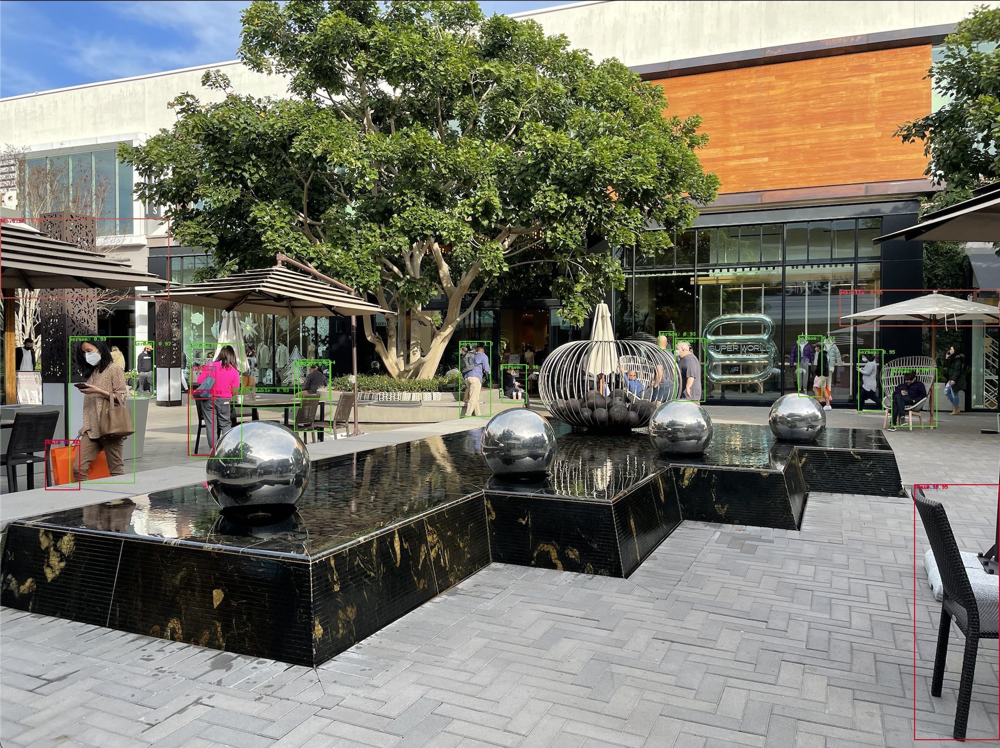

In [10]:
import random

label_color_map = {}
def random_color_generator():
    return (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

draw = ImageDraw.Draw(image)

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    color = label_color_map.setdefault(model.config.id2label[label.item()], random_color_generator())

    box = [round(i, 2) for i in box.tolist()]
    draw.rectangle(box, outline = color, width = 2)
    draw.text((box[0], box[1]), f"{model.config.id2label[label.item()]}: {round(score.item(), 2)}", fill = color)

    print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
    )

# image.show()
image

### YOLO (tiny-sized)

In [11]:
from transformers import YolosImageProcessor, YolosForObjectDetection
from PIL import Image
import torch
import requests

img_path = 'img1.png'
image = Image.open(img_path).convert("RGB")

model = YolosForObjectDetection.from_pretrained('hustvl/yolos-tiny')
image_processor = YolosImageProcessor.from_pretrained("hustvl/yolos-tiny")

inputs = image_processor(images=image, return_tensors="pt")
outputs = model(**inputs)

logits = outputs.logits
bboxes = outputs.pred_boxes

target_sizes = torch.tensor([image.size[::-1]])
results = image_processor.post_process_object_detection(outputs, threshold=0.9, target_sizes=target_sizes)[0]

config.json:   0%|          | 0.00/4.13k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/26.0M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/275 [00:00<?, ?B/s]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


Detected person with confidence 0.941 at location [898.1, 659.73, 955.75, 798.75]
Detected boat with confidence 0.96 at location [1061.17, 576.43, 1294.76, 845.81]
Detected person with confidence 0.992 at location [130.57, 651.96, 256.25, 931.48]
Detected person with confidence 0.994 at location [387.99, 660.35, 476.54, 853.34]
Detected person with confidence 0.98 at location [1290.44, 643.0, 1357.6, 780.83]
Detected person with confidence 0.907 at location [1583.45, 646.4, 1632.26, 766.09]
Detected person with confidence 0.905 at location [1689.94, 672.17, 1744.65, 795.49]


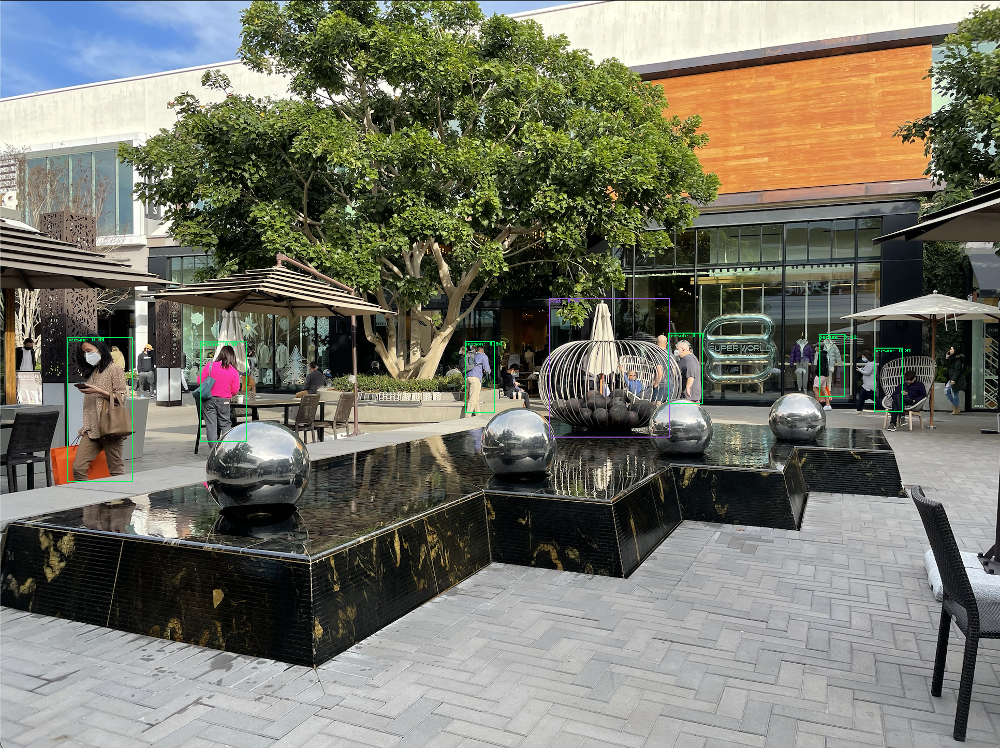

In [12]:
import random

label_color_map = {}
def random_color_generator():
    return (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

draw = ImageDraw.Draw(image)

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    color = label_color_map.setdefault(model.config.id2label[label.item()], random_color_generator())

    box = [round(i, 2) for i in box.tolist()]
    draw.rectangle(box, outline = color, width = 2)
    draw.text((box[0], box[1]), f"{model.config.id2label[label.item()]}: {round(score.item(), 2)}", fill = color)

    print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
    )

# image.show()
image

According to the Huggingface documentation, YOLO has a similar architecture to DETR and is more complex than Faster R-CNN. To evaluate the result, as one can notice from the two images above, DETR ResNet-50 gives a better result than YOLO does. There may be several reasons behind it, but the difference in model scale could be one of the main reasons. Model scale is significant; as the scale gets bigger, it produces a better result, and vice versa. Since the YOLO model I used is one with a tiny-sized version, the model scale, of course, would be small and lead to the model giving a worse outcome.